Count number of PTMs per tissue and add visualisation 

Heatmap: x-axis =  tissue, y-axis= type of ptm, colourgradient= count

In [1]:
from __future__ import division
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3
import mysql.connector

In [2]:
conn = mysql.connector.connect(user='root', password='password', host='127.0.0.1', port='3306',database='expression_atlas_shotgun', auth_plugin='mysql_native_password')
mycursor = conn.cursor()

# check the connection
if conn.is_connected():
    print("connection succesfull")
else:
    print("no connection")

connection succesfull


Tables necessary:

1. Peptide - count of PTMS
2. Assay - peptide
3. Tissue - assay

In [3]:
pep_ids = "SELECT peptide_id, mod_id, assay_id FROM peptide_modifications"
pep_ids_Data = pd.read_sql_query(pep_ids, conn)
pep_ids_Data.shape

In [ ]:
pep_ids_Data.head()

Error: Session cannot generate requests

In [ ]:
pep_ids_Data = pep_ids_Data.drop(columns=['peptide_id'])

In [ ]:
ptm_count = pep_ids_Data.groupby(['assay_id', 'mod_id']).size()
ptm_count = ptm_count.to_frame()
ptm_count = ptm_count.rename(columns={0: 'ptm_count'})

In [ ]:
ptm_count

ptm_count
assay_id mod_id           
13988    1              22
         2               9
         3               3
         4             158
         5               3
...                    ...
27703    1922            3
         1924            2
         1925            4
         1989            7
         2014            1

[627587 rows x 1 columns]

In [ ]:
ptm_count = ptm_count.reset_index(level=['assay_id', 'mod_id'])
ptm_count.shape

(627587, 3)

In [ ]:
ptm_count.head()

,assay_id,mod_id,ptm_count
0,13988,1,22
1,13988,2,9
2,13988,3,3
3,13988,4,158
4,13988,5,3


In [ ]:
tissueassay = "SELECT * FROM tissue_to_assay"
tissueData = pd.read_sql_query(tissueassay, conn)
tissueData.head()

,assay_id,tissue_id
0,13988,145
1,13989,145
2,13990,145
3,13991,145
4,13992,145


In [ ]:
assay_count = tissueData.groupby(['tissue_id']).size()
assay_count = assay_count.to_frame()
assay_count = assay_count.rename(columns={0: 'assay_count'})

In [ ]:
assay_count = assay_count.reset_index(level=['tissue_id'])
assay_count.shape

(147, 2)

In [ ]:
tissue_ids = "SELECT tissue_id, tissue_name, cell_type, disease_status FROM tissue"
tissue_id_Data = pd.read_sql_query(tissue_ids, conn)
tissue_id_Data.head()

,tissue_id,tissue_name,cell_type,disease_status
0,145,Brain,Brain,Healthy
1,146,Blood,Blood platelets,Healthy
2,147,Blood,Blood,Healthy
3,148,Unknown,Unknown,Cell culture
4,149,Colon,Colon,"no distinct annotation btw cell line, healthy ..."


In [ ]:
tissue_assay = pd.merge(tissueData, tissue_id_Data, on='tissue_id')

In [ ]:
tissue_assay = pd.merge(tissue_assay, assay_count, on='tissue_id')

In [ ]:
final = pd.merge(tissue_assay, ptm_count, on='assay_id')

Merge with modification column to get an idea of what the mods are

In [ ]:
mod_ids = "SELECT mod_id, modification_type FROM modifications"
mod_id_Data = pd.read_sql_query(mod_ids, conn)
mod_id_Data.head()

,mod_id,modification_type
0,1,Acetylation
1,2,Amidation
2,3,Biotinylation
3,4,Iodoacetamide derivative
4,5,Carbamylation


In [50]:
final2 = pd.merge(final, mod_id_Data, on='mod_id')
final2.head(20)


,assay_id,tissue_id,tissue_name,cell_type,disease_status,assay_count,mod_id,ptm_count,modification_type
0,13988,145,Brain,Brain,Healthy,37,1,22,Acetylation
1,13989,145,Brain,Brain,Healthy,37,1,30,Acetylation
2,13990,145,Brain,Brain,Healthy,37,1,43,Acetylation
3,13991,145,Brain,Brain,Healthy,37,1,20,Acetylation
4,13992,145,Brain,Brain,Healthy,37,1,35,Acetylation
5,13993,145,Brain,Brain,Healthy,37,1,32,Acetylation
6,13994,145,Brain,Brain,Healthy,37,1,21,Acetylation
7,13995,145,Brain,Brain,Healthy,37,1,25,Acetylation
8,13996,145,Brain,Brain,Healthy,37,1,34,Acetylation
9,13997,145,Brain,Brain,Healthy,37,1,19,Acetylation


In [51]:
final2 = final2.drop(columns=['assay_id'])

In [54]:
aggregation_functions = {'tissue_name': 'first', 'cell_type': 'first', 'disease_status': 'first', 'ptm_count': 'sum', 'modification_type': 'first', 'assay_count':'first'}
final3 = final2.groupby(['tissue_name', 'mod_id'], as_index=False).aggregate(aggregation_functions) #group on tissue name so there is no distinction (yet) between cell types

In [58]:
final3[final3['tissue_name'] =='Brain']

,mod_id,tissue_name,cell_type,disease_status,ptm_count,modification_type,assay_count
1948,1,Brain,Brain,Healthy,8757,Acetylation,37
1949,2,Brain,Brain,Healthy,2536,Amidation,37
1950,3,Brain,Brain,Healthy,1398,Biotinylation,37
1951,4,Brain,Brain,Healthy,149842,Iodoacetamide derivative,37
1952,5,Brain,Brain,Healthy,11618,Carbamylation,37
...,...,...,...,...,...,...,...
2364,2001,Brain,Brain,Diseased,1,carbobenzoxy-L-glutaminyl-glycine,1336
2365,2006,Brain,Brain,Healthy,6,O-Dichloroethylphosphate,37
2366,2007,Brain,Brain,Healthy,40,S-methyl amino phosphinate,37
2367,2008,Brain,Brain,Healthy,72,O-methyl amino phosphinate,37


In [59]:
len(final3['mod_id'].unique())

444

In [60]:
final_healthy = final3[final3['disease_status'] == 'Healthy']
final_healthy = final_healthy[~final_healthy['tissue_name'].isin(['Unknown'])]

In [61]:
final_healthy.head()

,mod_id,tissue_name,cell_type,disease_status,ptm_count,modification_type,assay_count
0,1,Adipose tissue,Adipose tissue,Healthy,783,Acetylation,14
1,2,Adipose tissue,Adipose tissue,Healthy,158,Amidation,14
2,3,Adipose tissue,Adipose tissue,Healthy,94,Biotinylation,14
3,4,Adipose tissue,Adipose tissue,Healthy,9229,Iodoacetamide derivative,14
4,5,Adipose tissue,Adipose tissue,Healthy,893,Carbamylation,14


In [62]:
#normalize for the amount of assays per tissue, divide the ptm count by the assay count
final_healthy_norm = final_healthy
final_healthy_norm['ptm_count'] = final_healthy_norm['ptm_count']/final_healthy_norm['assay_count']
final_healthy_norm.head(15)

,mod_id,tissue_name,cell_type,disease_status,ptm_count,modification_type,assay_count
0,1,Adipose tissue,Adipose tissue,Healthy,55.928571,Acetylation,14
1,2,Adipose tissue,Adipose tissue,Healthy,11.285714,Amidation,14
2,3,Adipose tissue,Adipose tissue,Healthy,6.714286,Biotinylation,14
3,4,Adipose tissue,Adipose tissue,Healthy,659.214286,Iodoacetamide derivative,14
4,5,Adipose tissue,Adipose tissue,Healthy,63.785714,Carbamylation,14
5,6,Adipose tissue,Adipose tissue,Healthy,55.071429,Iodoacetic acid derivative,14
6,7,Adipose tissue,Adipose tissue,Healthy,477.571429,Deamidation,14
7,8,Adipose tissue,Adipose tissue,Healthy,5.928571,Gygi ICAT(TM) d0,14
8,9,Adipose tissue,Adipose tissue,Healthy,5.071429,Gygi ICAT(TM) d8,14
9,10,Adipose tissue,Adipose tissue,Healthy,8.214286,Homoserine,14


In [63]:
final_healthy2 = final_healthy_norm[['tissue_name', 'mod_id', 'ptm_count']]

In [64]:
fhp = final_healthy2.pivot('tissue_name', 'mod_id', 'ptm_count')
fhp = fhp.fillna(0)
fhp.head()

mod_id,1,2,3,4,5,6,7,8,9,10,...,1986,1987,1989,1990,1992,2001,2006,2007,2008,2014
tissue_name,,,,,,,,,,,,,,,,,,,,,
Adipose tissue,55.928571,11.285714,6.714286,659.214286,63.785714,55.071429,477.571429,5.928571,5.071429,8.214286,...,1.142857,0.928571,1.642857,0.000000,0.642857,0.0,0.0,1.285714,3.642857,1.428571
Adrenal gland,222.666667,75.666667,32.666667,3609.000000,918.333333,79.000000,754.000000,17.000000,16.333333,32.333333,...,2.000000,0.750000,6.500000,0.000000,0.250000,0.0,1.0,0.000000,5.666667,0.666667
Appendix,31.500000,23.000000,20.000000,442.500000,202.000000,32.000000,153.500000,14.500000,19.000000,17.000000,...,0.000000,0.000000,1.000000,0.000000,0.500000,0.0,0.0,0.000000,0.000000,0.000000
B-cells,893.333333,243.000000,128.000000,19282.666667,307.000000,428.333333,4231.000000,53.666667,63.333333,75.333333,...,0.208333,2.000000,47.333333,0.666667,0.166667,0.0,0.0,2.000000,0.000000,1.000000
Blood,296.878788,159.984848,121.924242,5284.727273,455.727273,382.151515,2596.590909,61.181818,57.090909,79.924242,...,4.893939,0.187582,12.712121,0.136364,1.666667,0.0,0.0,3.454545,18.242424,10.621212


In [65]:
normalized_fhp=(fhp-fhp.min())/(fhp.max()-fhp.min()) #column wise min max normalization to improve visualisation

In [73]:
sns.reset_orig

<function seaborn.rcmod.reset_orig()>

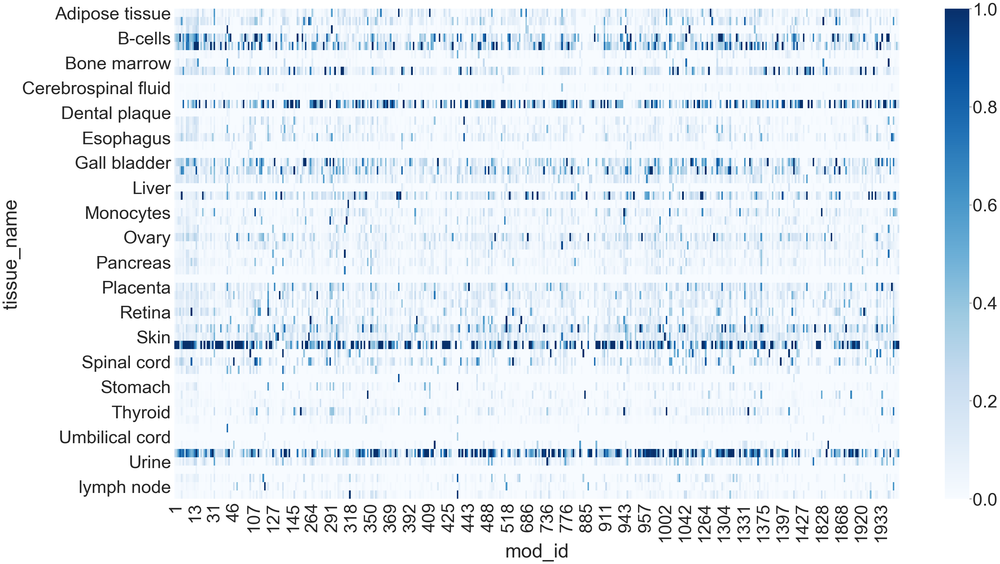

In [74]:
fig, ax = plt.subplots(figsize=(45,25))
sns.set(font_scale=4.5)
x = sns.color_palette("Blues", as_cmap=True)
ax = sns.heatmap(normalized_fhp, cmap=x)

### Watch out, there could be some enrichment experiments in the datasets! eg. acetylation enrichment like at the Gevaert lab

### We can try it by using only the shotgun proteomic experiments

In [86]:
shotgun_project = "SELECT * FROM expression_atlas2.project"
shotgun_projectData = pd.read_sql_query(shotgun_project, conn)
shotgun_projectData = shotgun_projectData[shotgun_projectData['experiment_type'] == '["Shotgun proteomics"]']
shotgun_projectData = shotgun_projectData['project_id'].tolist()

In [92]:
shotgun_assay = "SELECT * FROM expression_atlas2.assay"
shotgun_assayData = pd.read_sql_query(shotgun_assay, conn)
shotgun_assayData = shotgun_assayData[shotgun_assayData['project_id'].isin(shotgun_projectData)]
shotgun_assayData = shotgun_assayData['assay_id'].tolist() #use this list and use only the assays in this list!

In [96]:
ptm_count_shotgun = ptm_count.copy(deep=True)
ptm_count_shotgun = ptm_count_shotgun[ptm_count_shotgun['assay_id'].isin(shotgun_assayData)]

In [102]:
tissueassay = "SELECT * FROM tissue_to_assay"
tissueData_shotgun = pd.read_sql_query(tissueassay, conn)
tissueData_shotgun.head()
tissueData_shotgun = tissueData_shotgun[tissueData_shotgun['assay_id'].isin(shotgun_assayData)]
assay_count_shotgun = tissueData_shotgun.groupby(['tissue_id']).size()
assay_count_shotgun = assay_count_shotgun.to_frame()
assay_count_shotgun = assay_count_shotgun.rename(columns={0: 'assay_count'})

assay_count_shotgun = assay_count_shotgun.reset_index(level=['tissue_id'])
assay_count_shotgun.shape

(126, 2)

In [104]:
tissue_ids = "SELECT tissue_id, tissue_name, cell_type, disease_status FROM tissue"
tissue_id_Data = pd.read_sql_query(tissue_ids, conn)
tissue_id_Data.head()

,tissue_id,tissue_name,cell_type,disease_status
0,145,Brain,Brain,Healthy
1,146,Blood,Blood platelets,Healthy
2,147,Blood,Blood,Healthy
3,148,Unknown,Unknown,Cell culture
4,149,Colon,Colon,"no distinct annotation btw cell line, healthy ..."


In [106]:
tissue_assay_shotgun = pd.merge(tissueData_shotgun, tissue_id_Data, on='tissue_id')
tissue_assay_shotgun = pd.merge(tissue_assay_shotgun, assay_count_shotgun, on='tissue_id')
final_shotgun = pd.merge(tissue_assay_shotgun, ptm_count_shotgun, on='assay_id')

In [107]:
final_shotgun

,assay_id,tissue_id,tissue_name,cell_type,disease_status,assay_count,mod_id,ptm_count
0,16201,145,Brain,Brain,Healthy,6,1,49
1,16201,145,Brain,Brain,Healthy,6,2,10
2,16201,145,Brain,Brain,Healthy,6,3,8
3,16201,145,Brain,Brain,Healthy,6,4,541
4,16201,145,Brain,Brain,Healthy,6,5,171
...,...,...,...,...,...,...,...,...
511050,27689,450,Tonsil,Tonsil,Healthy,56,1389,2
511051,27689,450,Tonsil,Tonsil,Healthy,56,1421,11
511052,27689,450,Tonsil,Tonsil,Healthy,56,1918,2
511053,27689,450,Tonsil,Tonsil,Healthy,56,1922,1


In [108]:
final2_shotgun = pd.merge(final_shotgun, mod_id_Data, on='mod_id')
final2_shotgun.head(20)


,assay_id,tissue_id,tissue_name,cell_type,disease_status,assay_count,mod_id,ptm_count,modification_type
0,16201,145,Brain,Brain,Healthy,6,1,49,Acetylation
1,16202,145,Brain,Brain,Healthy,6,1,40,Acetylation
2,16203,145,Brain,Brain,Healthy,6,1,69,Acetylation
3,27514,145,Brain,Brain,Healthy,6,1,18,Acetylation
4,27515,145,Brain,Brain,Healthy,6,1,19,Acetylation
5,27516,145,Brain,Brain,Healthy,6,1,7,Acetylation
6,25222,147,Blood,Blood,Healthy,147,1,1,Acetylation
7,25224,147,Blood,Blood,Healthy,147,1,1,Acetylation
8,25258,147,Blood,Blood,Healthy,147,1,4,Acetylation
9,25288,147,Blood,Blood,Healthy,147,1,1,Acetylation


In [109]:
final2_shotgun = final2_shotgun.drop(columns=['assay_id'])
aggregation_functions = {'tissue_name': 'first', 'cell_type': 'first', 'disease_status': 'first', 'ptm_count': 'sum', 'modification_type': 'first', 'assay_count':'first'}
final3_shotgun = final2_shotgun.groupby(['tissue_name', 'mod_id'], as_index=False).aggregate(aggregation_functions) #group on tissue name so there is no distinction (yet) between cell types

In [123]:
final_healthy_shotgun = final3_shotgun[final3_shotgun['disease_status'] == 'Healthy']
final_healthy_shotgun = final_healthy_shotgun[~final_healthy_shotgun['tissue_name'].isin(['Unknown'])]

#normalize for the amount of assays per tissue, divide the ptm count by the assay count
final_healthy_norm_shotgun = final_healthy_shotgun
final_healthy_norm_shotgun['ptm_count'] = final_healthy_norm_shotgun['ptm_count']/final_healthy_norm_shotgun['assay_count']
final_healthy_norm_shotgun.head(15)

final_healthy2_shotgun = final_healthy_norm_shotgun[['tissue_name', 'modification_type', 'ptm_count']]

fhp_sh = final_healthy2_shotgun.pivot('tissue_name', 'modification_type', 'ptm_count')
fhp_sh = fhp_sh.fillna(0)
fhp_sh.head()

modification_type,(-)-dehydroepigallocatechin,(-)-epigallocatechin-3-gallate,(Iodo)-uracil MP,"(cis,cis-delta 5, delta 8)-tetradecadienoyl",(cis-delta 5)-tetradecaenoyl,1-methyl-3-benzoyl-4-hydroxy-4-phenylpiperidine,13C labelled iodoacetanilide derivative,"2,3,4,6-tetra-O-Acetyl-1-allyl-alpha-D-galactopyranoside modification of cysteine","2,3-dihydro-2,2-dimethyl-7-benzofuranol N-methyl carbamate","2,4-Dinitrobenzenesulfenyl",...,triglutamyl,triiodo,tris adduct causes 104 Da addition at asparagine-succinimide intermediate,tri nitro benzene,tryptophan oxidation to hydroxykynurenin,tryptophan oxidation to kynurenin,ubiquitinylation residue,uridine phosphodiester,was Biotin-maleimide,was PentylamineBiotin
tissue_name,,,,,,,,,,,,,,,,,,,,,
Adipose tissue,0.500000,0.000000,0.0,0.142857,0.214286,0.00,1.500000,0.0,22.714286,0.0,...,0.142857,0.0,1.642857,0.571429,0.642857,1.857143,0.571429,0.0,0.142857,0.071429
Adrenal gland,0.000000,0.000000,0.0,0.250000,0.000000,0.75,1.000000,0.0,4.750000,0.0,...,0.000000,0.0,0.250000,1.250000,0.750000,6.500000,0.500000,0.0,0.000000,0.000000
Appendix,0.000000,0.000000,0.0,0.000000,0.500000,0.00,0.000000,0.5,0.500000,0.0,...,0.000000,0.0,0.000000,0.000000,1.000000,11.000000,1.000000,0.0,0.000000,0.000000
B-cells,0.083333,0.000000,0.0,0.000000,0.000000,0.00,0.458333,0.0,0.833333,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,6.500000,0.208333,0.0,0.000000,0.000000
Blood,0.000000,0.054054,0.0,0.000000,0.000000,0.00,4.824561,0.0,38.087719,0.0,...,0.000000,0.0,0.000000,0.000000,6.526316,59.551020,4.824561,0.0,0.000000,0.000000


In [124]:
normalized_fhp_sh=(fhp_sh-fhp_sh.min())/(fhp_sh.max()-fhp_sh.min()) #column wise min max normalization to improve visualisation

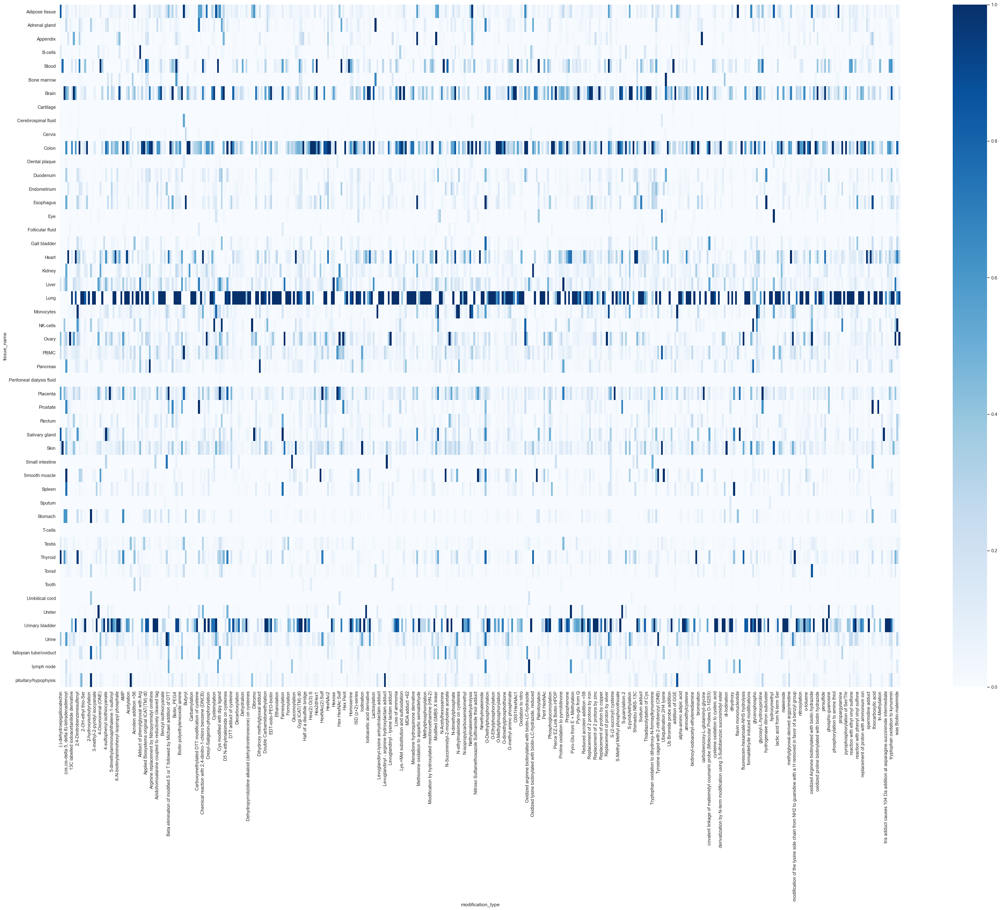

In [125]:
fig, ax = plt.subplots(figsize=(45,30))
x = sns.color_palette("Blues", as_cmap=True)
ax = sns.heatmap(normalized_fhp_sh, cmap=x)
fig = ax.get_figure()
fig.savefig('heatmap_ptms_shotgun_healthy_fullname.png') 

In [ ]:
final_healthy2_shotgun = final_healthy_norm_shotgun[['tissue_name', 'modification_type', 'ptm_count']]

fhp_sh = final_healthy2_shotgun.pivot('tissue_name', 'modification_type', 'ptm_count')
fhp_sh = fhp_sh.fillna(0)
fhp_sh.head()

# IDEA: limit to the most frequently occuring PTMs 

In [142]:
freq_final_healthy_norm_shotgun = final_healthy_norm_shotgun[final_healthy_norm_shotgun['ptm_count']>=20]
print(final_healthy_norm_shotgun.shape)
print(freq_final_healthy_norm_shotgun.shape)

(12733, 7)
(1206, 7)


In [143]:
freq_final_healthy2_shotgun = freq_final_healthy_norm_shotgun[['tissue_name', 'modification_type', 'ptm_count']]

freq_fhp_sh = freq_final_healthy2_shotgun.pivot('tissue_name', 'modification_type', 'ptm_count')
freq_fhp_sh = freq_fhp_sh.fillna(0)
freq_fhp_sh.head()

modification_type,13C labelled iodoacetanilide derivative,"2,3-dihydro-2,2-dimethyl-7-benzofuranol N-methyl carbamate","2,5-dimethypyrrole",2-OH-ethyl thio-Ser,2-amino-3-oxo-butanoic_acid,2-hydroxyisobutyrylation,3-(carbamidomethylthio)propanoyl,3-methyl-2-pyridyl isocyanate,4-hydroxynonenal (HNE),"5-hydroxy-N6,N6,N6-trimethyl",...,reduction,replacement of proton with ammonium ion,spermidine adduct,thiocarboxylic acid,transamidation of glycine ethyl ester to glutamine,tri-Methylation,tris adduct causes 104 Da addition at asparagine-succinimide intermediate,tri nitro benzene,tryptophan oxidation to kynurenin,ubiquitinylation residue
tissue_name,,,,,,,,,,,,,,,,,,,,,
Adipose tissue,0.0,22.714286,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,24.50000,67.142857,0.0,0.0,0.0,0.00000,0.0,0.0,0.00000,0.0
Adrenal gland,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.00000,20.500000,0.0,0.0,0.0,0.00000,0.0,0.0,0.00000,0.0
Appendix,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.00000,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.00000,0.0
B-cells,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,24.37500,88.041667,0.0,0.0,0.0,0.00000,0.0,0.0,0.00000,0.0
Blood,0.0,38.087719,0.0,0.0,160.052632,0.0,0.0,0.0,121.315789,0.0,...,60.62585,50.605442,0.0,0.0,0.0,73.44898,0.0,0.0,59.55102,0.0


In [144]:
normalized_freq_fhp_sh=(freq_fhp_sh-freq_fhp_sh.min())/(freq_fhp_sh.max()-freq_fhp_sh.min()) #column wise min max normalization to improve visualisation

In [150]:
normalized_freq_fhp_sh.head()

modification_type,13C labelled iodoacetanilide derivative,"2,3-dihydro-2,2-dimethyl-7-benzofuranol N-methyl carbamate","2,5-dimethypyrrole",2-OH-ethyl thio-Ser,2-amino-3-oxo-butanoic_acid,2-hydroxyisobutyrylation,3-(carbamidomethylthio)propanoyl,3-methyl-2-pyridyl isocyanate,4-hydroxynonenal (HNE),"5-hydroxy-N6,N6,N6-trimethyl",...,reduction,replacement of proton with ammonium ion,spermidine adduct,thiocarboxylic acid,transamidation of glycine ethyl ester to glutamine,tri-Methylation,tris adduct causes 104 Da addition at asparagine-succinimide intermediate,tri nitro benzene,tryptophan oxidation to kynurenin,ubiquitinylation residue
tissue_name,,,,,,,,,,,,,,,,,,,,,
Adipose tissue,0.0,0.103130,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.027152,0.054908,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
Adrenal gland,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.016764,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
Appendix,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
B-cells,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,...,0.027013,0.071998,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
Blood,0.0,0.172929,0.0,0.0,0.392286,0.0,0.0,0.0,0.357512,0.0,...,0.067188,0.041384,0.0,0.0,0.0,0.435468,0.0,0.0,0.625755,0.0


In [160]:
fig, ax = plt.subplots(figsize=(200,100))
x = sns.color_palette("Blues", as_cmap=True)
ax = sns.heatmap(normalized_freq_fhp_sh, cmap=x)
fig = ax.get_figure()
fig.savefig('heatmap_ptms_shotgun_healthy_fullname_frequent.png') 